6 13
0 0 1.2585875555739698,103.57552810087203
0 1 1.2552302378887394,103.57552810087203
0 2 1.2518729158929922,103.57552810087203
0 3 1.2485155895981783,103.57552810087203
0 4 1.2451582590158496,103.57552810087203
0 5 1.2418009241575831,103.57552810087203
1 0 1.2585875555739698,103.5787843026161
1 1 1.2552302378887394,103.5787843026161
1 2 1.2518729158929922,103.5787843026161
1 3 1.2485155895981783,103.5787843026161
1 4 1.2451582590158496,103.5787843026161
1 5 1.2418009241575831,103.5787843026161
2 0 1.2585875555739698,103.5820405043602
2 1 1.2552302378887394,103.5820405043602
2 2 1.2518729158929922,103.5820405043602
2 3 1.2485155895981783,103.5820405043602
2 4 1.2451582590158496,103.5820405043602
2 5 1.2418009241575831,103.5820405043602
3 0 1.2585875555739698,103.5852967061043
3 1 1.2552302378887394,103.5852967061043
3 2 1.2518729158929922,103.5852967061043
3 3 1.2485155895981783,103.5852967061043
3 4 1.2451582590158496,103.5852967061043
3 5 1.2418009241575831,103.5852967061043
4 0 1

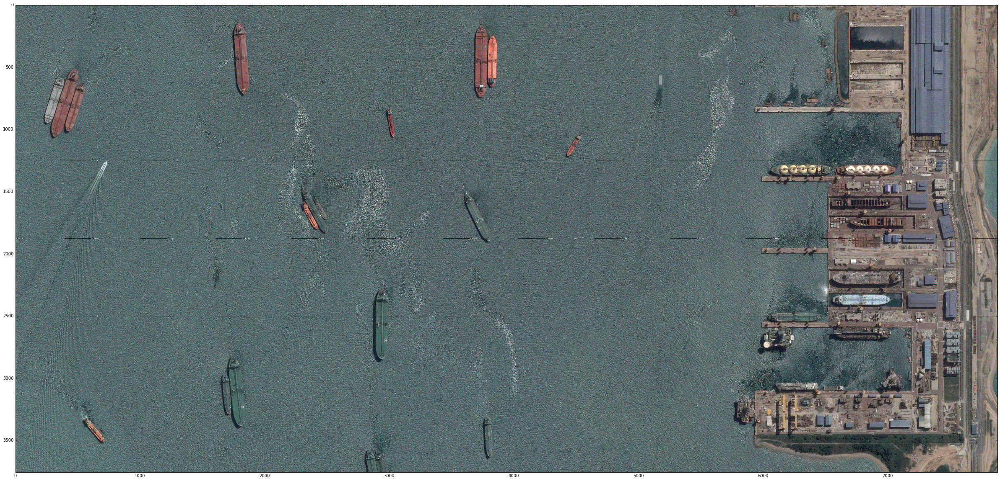

In [7]:
from PIL import Image
import urllib
import io
import urllib.parse
import urllib.request
import matplotlib.pyplot as plt
#imshow
import numpy as np
%matplotlib inline
#import, StringIO
from math import log, exp, tan, atan, pi, ceil

EARTH_RADIUS = 6378137
EQUATOR_CIRCUMFERENCE = 2 * pi * EARTH_RADIUS
INITIAL_RESOLUTION = EQUATOR_CIRCUMFERENCE / 256.0
ORIGIN_SHIFT = EQUATOR_CIRCUMFERENCE / 2.0

def latlontopixels(lat, lon, zoom):
    mx = (lon * ORIGIN_SHIFT) / 180.0
    my = log(tan((90 + lat) * pi/360.0))/(pi/180.0)
    my = (my * ORIGIN_SHIFT) /180.0
    res = INITIAL_RESOLUTION / (2**zoom)
    px = (mx + ORIGIN_SHIFT) / res
    py = (my + ORIGIN_SHIFT) / res
    return px, py

def pixelstolatlon(px, py, zoom):
    res = INITIAL_RESOLUTION / (2**zoom)
    mx = px * res - ORIGIN_SHIFT
    my = py * res - ORIGIN_SHIFT
    lat = (my / ORIGIN_SHIFT) * 180.0
    lat = 180 / pi * (2*atan(exp(lat*pi/180.0)) - pi/2.0)
    lon = (mx / ORIGIN_SHIFT) * 180.0
    return lat, lon

############################################

# a neighbourhood in Lajeado, Brazil:

#upperleft =  '-29.44,-52.0'  
#lowerright = '-29.45,-51.98'
upperleft =  '1.260588,103.573900'  
lowerright = '1.240448,103.616173'

#1.260588, 103.573900
#1.240448, 103.616173
zoom = 18  # be careful not to get too many images!

############################################

ullat, ullon = map(float, upperleft.split(','))
lrlat, lrlon = map(float, lowerright.split(','))

# Set some important parameters
scale = 1
maxsize = 640

# convert all these coordinates to pixels
ulx, uly = latlontopixels(ullat, ullon, zoom)
lrx, lry = latlontopixels(lrlat, lrlon, zoom)

# calculate total pixel dimensions of final image
dx, dy = lrx - ulx, uly - lry

# calculate rows and columns
cols, rows = int(ceil(dx/maxsize)), int(ceil(dy/maxsize))

# calculate pixel dimensions of each small image
bottom = 120
largura = int(ceil(dx/cols))
altura = int(ceil(dy/rows))
alturaplus = altura + bottom

plt.figure(figsize=(200,20))
final = Image.new("RGB", (int(dx), int(dy)))
print (rows, cols)
for x in range(cols):
    for y in range(rows):
        dxn = largura * (0.5 + x)
        dyn = altura * (0.5 + y)
        latn, lonn = pixelstolatlon(ulx + dxn, uly - dyn - bottom/2, zoom)
        position = ','.join((str(latn), str(lonn)))
        print (x, y, position)
        urlparams = urllib.parse.urlencode({'center': position,
                                      'zoom': str(zoom),
                                      'size': '%dx%d' % (largura, alturaplus),
                                      'maptype': 'satellite',
                                      'sensor': 'false',
                                      'scale': scale})
        url = 'http://maps.google.com/maps/api/staticmap?' + urlparams
        f=urllib.request.urlopen(url)
        im=Image.open(io.BytesIO(f.read()))
        final.paste(im, (int(x*largura), int(y*altura)))
        #imshow(np.asarray(im.convert('P')),cmap='gray',vmin=0,vmax=255)
        #plt.subplot(cols, rows, x+y+1)
        #plt.imshow(im.convert('P'))
plt.imshow(final.convert('P'))